In [2]:
#Les classiques
import numpy as np
import matplotlib.pyplot as plt
from cycler import cycler
import matplotlib as mpl
import pandas as pd

#modules de machine learning
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import learning_curve, validation_curve
from sklearn import preprocessing

#modules de stats pour ANOVA
import statsmodels.api as sm
from statsmodels.formula.api import ols

In [3]:
#stud_var is a string ('')
def anova(names, stud_var):
    stud_var += ' ~'
    for i in range(len(names)):
        stud_var+= ' + ' + 'C(' + names[i] + ')'
    print(stud_var)
    model = ols(stud_var, df).fit()
    model.summary()
    res = sm.stats.anova_lm(model, typ= 1)   # Need type 1 to agree with paper and with Matlab
    print(res)
    objects=names
    objects=tuple(objects)
    y_pos = np.arange(len(objects))  # this just makes an array [0, 1, 2, 3]
                                     # arrange makes evenly spaced values on a 
                                     # given interval.  Sort of expects integers

    totalSSRnoRes = sum(res.sum_sq)-res.sum_sq[-1]  # for normalizing

    performance = []
    for i in range(len(objects)):
        performance+=[res.sum_sq[i]/totalSSRnoRes]

    plt.figure()                   # can number them but they will not overwrite unless you close them

    if len(objects)==3:
        colour=['skyblue', 'peru', 'yellowgreen']
    elif len(objects)==2:
        colour=['skyblue', 'peru']
    elif len(objects)==4:
        colour=['skyblue', 'peru', 'yellowgreen', 'gold']
    elif len(objects)==5:
        colour=['skyblue', 'peru', 'yellowgreen', 'gold', 'pink']

    plt.bar(y_pos, performance, 
            align='center', 
            width=0.8,              # default is 0.8
            alpha=1.0,              # this is transparency, 1.0 is solid
            color=colour)
    plt.xticks(y_pos, objects)

    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    font = {'size': 18}
    plt.xlabel('Conditions', font)
    plt.ylabel('Fraction of total variance', font)
    plt.title('Anova', font)

    print(performance)
    plt.show()

In [4]:
#define df et names before hand
#stud_var is a string ('')
#size is an array [] giving the range of the obtained results
def pred_fit(stud_var, size):

#Optimistion of C:
    variable = df.loc[:, names]
    target = df[stud_var]
    param_range = np.linspace(2,200,50)   # set the range for parameter C
    train_loss, test_loss = validation_curve(
            svm.SVR(kernel='rbf', gamma=0.5), 
            preprocessing.scale(variable), preprocessing.scale(target.values.ravel()), param_name='C',
            param_range=param_range, cv=10, 
            scoring = 'neg_mean_squared_error')
    train_loss_mean = -np.mean(train_loss, axis=1)
    test_loss_mean = -np.mean(test_loss, axis=1)
    plt.figure(1)
    plt.plot(param_range, train_loss_mean, 'o-', color="r", label="Training")
    plt.plot(param_range, test_loss_mean, 'o-', color="g", label="Cross_validation")
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)
    font = {'size': 22}
    plt.xlabel("C", font)
    plt.ylabel("Loss", font)
    plt.legend(loc="best", fontsize=22)
    plt.show()
    label=[]
    verif=[]
    for i in range(len(param_range)):    
        label+=[[test_loss_mean[i], param_range[i]]]
        verif+=[[train_loss_mean[i], param_range[i]]]
    C=min(label)[1]
    a=label.index(min(label))
    if C<100:
        C=100

#Optimistion of gamma:
    param_range = np.linspace(0,1,50) # set the range for parameter gamma
    train_loss, test_loss = validation_curve(
             svm.SVR(kernel='rbf', C=C),
             preprocessing.scale(variable), preprocessing.scale(target.values.ravel()),
             param_name='gamma',
             param_range=param_range, cv=10,
             scoring = 'neg_mean_squared_error')
    train_loss_mean = -np.mean(train_loss, axis=1)
    test_loss_mean = -np.mean(test_loss, axis=1)
    label=[]
    for i in range(len(param_range)):    
        label+=[[test_loss_mean[i], param_range[i]]]
    gamma=min(label)[1]
    a=label.index(min(label))
    if a<len(label)-1:
        if label[a][0] < label[a+1][0]-0.1:
            del label[a]
        gamma=min(label)[0]
    if gamma==0:
        gamma=0.1
    plt.figure(2)
    plt.plot(param_range, train_loss_mean, 'o-', color="r", label="Training")
    plt.plot(param_range, test_loss_mean, 'o-', color="g", label="Cross_validation")
    plt.xticks(fontsize=22)
    plt.yticks(fontsize=22)
    font = {'size': 22}
    plt.xlabel("gamma", font)
    plt.ylabel("Loss", font)
    plt.legend(loc="best", fontsize=22)
    plt.show()

#optimisation of epsilon
    param_range = np.linspace(0,1,50) # set the range for parameter gamma
    train_loss, test_loss = validation_curve(
         svm.SVR(kernel='rbf', C=C, gamma=gamma),
         preprocessing.scale(variable), preprocessing.scale(target.values.ravel()),
         param_name='epsilon',
         param_range=param_range, cv=10,
         scoring = 'neg_mean_squared_error')
    train_loss_mean = -np.mean(train_loss, axis=1)
    test_loss_mean = -np.mean(test_loss, axis=1)
    label=[]
    verif=[]
    epsilon=0
    for i in range(len(param_range)):    
        label+=[[test_loss_mean[i], param_range[i]]]
        verif+=[[train_loss_mean[i], param_range[i]]]
        if verif[i][0]>0.0001 and verif[i-1][0]<0.0001:
            epsilon=verif[i][1]
    plt.figure(3)
    plt.plot(param_range, train_loss_mean, 'o-', color="r", label="Training")
    plt.plot(param_range, test_loss_mean, 'o-', color="g", label="Cross_validation")
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    font = {'size':15}
    plt.xlabel("epsilon")
    plt.ylabel("Loss")
    plt.legend(loc="best",fontsize=15)
    plt.show()

#fitting function creation:
    reg_stud_var = Pipeline(steps = [('scl', StandardScaler()), ('clf', svm.SVR(kernel='rbf', gamma=gamma, C=C, epsilon=epsilon))])
    reg_stud_var.fit(variable, target) #fit the fundtion to the values.
    calc_var= stud_var + '_pred_svm'
    df[calc_var] = reg_stud_var.predict(variable) # crée une colonne dans le tableau avec les nouvelles valeurs prédites

#graph plotting:
    fig, ax1 = plt.subplots(1, 1, clear=True, num='PCE_pred', figsize=(5, 4))
    for label, data in df.groupby('exp'):
        plt.plot(stud_var, calc_var,'o', color=data['color'].iloc[0], data=data, label=label)
       # plt.legend()
    plt.autoscale(enable=True)
    plt.plot(size, size, ls="--", c=".3") #Trace la courbe x=y. Adapter les valeurs dans les [] aux valeurs utilisées.
    ylabel = 'Predicted ' + stud_var + ' (%)'
    xlabel = 'Mesured ' + stud_var + ' (%)'
    ax1.set_ylabel(ylabel)
    ax1.set_xlabel(xlabel)
    plt.tight_layout()

#Linear regration and r2 calculation
    X=df[[stud_var]]
    y=df[[calc_var]]
    modeleReg=LinearRegression()
    modeleReg.fit(X, y)
    modeleReg.score(X,y)
    r2=modeleReg.score(X,y)
    plt.show()
    print('R2 =', r2)
    print('C=', C)
    print('gamma=', gamma)
    print('epsilon=', epsilon)
    return reg_stud_var

In [30]:
#df, names, data_v and data_u to be defined before hand.
#fonc is the fitting function optimised in the previous program.
def surface_plot(fonc, xmin, xmax, ymin, ymax, vmin, vmax, colour):
    ## Optimisation of 2 parameters
    if len(names)==2:
        x_len, y_len = 100, 100
        xs = np.linspace(xmin, xmax, x_len)
        ys = np.linspace(ymin, ymax, y_len)
        xi, yi = names[0], names[1]
        fig, axs = plt.subplots(nrows=1, ncols=1, sharex=True, sharey=True, clear=True, num='rbf pce plot', figsize=(10, 10))
        xm, ym = np.meshgrid(xs,ys)
        r = np.c_[xm.flatten(), ym.flatten()]
    #compute the values from the fit
        c = fonc.predict(r).reshape(x_len, y_len)

	#Make a contour map
        cmap = axs.contour(xs, ys, c, vmin=vmin, vmax=vmax, cmap='gray_r')
        plt.clabel(cmap, inline=1, fontsize=10)
	# Make a value map
        pmap = axs.pcolormesh(xs, ys, c, shading='gouraud', vmin=vmin,	vmax=vmax, cmap=colour)
        for label,data in df.groupby('exp'):
            axs.plot(names[0], names[1],'o',color=data['color'].iloc[0], data=data.iloc[0], mec='k', mew=0.5, label=label)
        axs.set_ylabel(f'{yi}')
        axs.set_xlabel(f'{xi}')
    
    ## Optimisation of 3 parameters
    if len(names)==3:
        v_len = len(data_v)
        vs = data_v
        x_len, y_len = 100, 100
        xs = np.linspace(xmin, xmax, x_len)
        ys = np.linspace(ymin, ymax, y_len)
        vi, xi, yi = names[0], names[1], names[2]
        fig, axs = plt.subplots(nrows=1, ncols=v_len, sharex=True, sharey=True, clear=True, num='rbf pce plot', figsize=(13, 4))
        for ax, v in zip(axs, vs):
            xm, ym = np.meshgrid(xs,ys)
            vm = v * np.ones_like(xm)
            r = np.c_[vm.flatten(), xm.flatten(), ym.flatten()]
    
	#compute the values from the fit
            c = fonc.predict(r).reshape(x_len, y_len)

	#Make a contour map
            cmap = ax.contour(xs, ys, c, vmin=vmin, vmax=vmax, cmap='gray_r')
            plt.clabel(cmap, inline=1, fontsize=10)
	# Make a value map
            pmap = ax.pcolormesh(xs, ys, c, shading='gouraud', vmin=vmin,	vmax=vmax, cmap=colour)
	# Plot the experimental points
            for label,data in df.query(vi + ' ==@v').groupby('exp'):
                ax.plot(names[1], names[2],'o',color=data['color'].iloc[0], data=data.iloc[0], mec='k', mew=0.5, label=label)
            ax.set_ylabel(f'{yi}')
            ax.set_xlabel(f'{xi} @ {vi} ={v:.2f}')
    
    ## Optimisation of 4 parameters
    elif len(names)==4:
        v_len = len(data_v)
        u_len= len(data_u)
        vs = data_v
        us = data_u
        x_len, y_len = 100, 100
        xs = np.linspace(xmin, xmax, x_len)
        ys = np.linspace(ymin, ymax, y_len)
        xi, yi, ui, vi = names[0], names[1], names[2], names[3]
        fig, axs = plt.subplots(nrows=u_len, ncols=v_len, sharex=True, sharey=True, clear=True, num='rbf pce plot', figsize=(13, 4*u_len))
        for u, i in zip(us, range(u_len)):    
            for ax, v in zip(axs[i], vs):
                xm, ym = np.meshgrid(xs,ys)
                vm = v * np.ones_like(xm)
                um = u * np.ones_like(xm)
                r = np.c_[xm.flatten(), ym.flatten(), um.flatten(), vm.flatten()]
	#compute the values from the fit
                c = fonc.predict(r).reshape(x_len, y_len)

	#Make a contour map
                cmap = ax.contour(xs, ys, c, vmin=vmin, vmax=vmax, cmap='gray_r')
                plt.clabel(cmap, inline=1, fontsize=10)
	# Make a value map
                pmap = ax.pcolormesh(xs, ys, c, shading='gouraud', vmin=vmin,	vmax=vmax, cmap=colour)
	# Plot the experimental points
                for label,data in df.query(vi + ' ==@v' + ' and ' + ui + '==@u').groupby('exp'):
                    ax.plot(names[0],names[1],'o',color=data['color'].iloc[0], data=data.iloc[0], mec='k', mew=0.5, label=label)
                ax.set_ylabel(f'[{yi}] // [{ui}]={u:.2f}')
                ax.set_xlabel(f'[{xi}] // [{vi}] ={v:.2f}')
    #ax.plot(0.215, 0.44,'o',color='black', mec='k', mew=0.5, label=label)
    plt.tight_layout()
    plt.colorbar(pmap, ax=axs, fraction=0.01)
    plt.show()

In [37]:
df = pd.read_csv("TEMPO ML 1st irradiation.csv", sep=";") #CSV table in the same folder as the programme!
##deleting NaNs: if df contains NaN cells when displayed, the first line below can be used to
#delete rows with less than 'x' non-NaN values (change according to the table obtained) 
#2 deletes columns containing at least one NaN.
#df = df.dropna(thresh=7)
#df= df.dropna(axis='columns')# remove NaNs
colors = plt.cm.tab20(np.linspace(0, 1, 20)[0:len(df.exp.unique())])
color_dic = {label: color for label, color in zip(df.exp.unique(), colors)}
df['color'] = df.exp.map(color_dic) #ajoute une colonne 'color' à df pour donner une couleur unique à chaque expériences

names = ['TEMPO', 'TEMPOBF4', 'LiI', 'LiTFSI'] #utiliser ici le nom des colonnes exact de df

df

,exp,TEMPO,TEMPOBF4,LiI,LiTFSI,PCE,AVT,LUEp,color
0,1,0.15,0.075,0.3,0.0,0.940,56.00,4.238325,"[0.12156862745098039, 0.4666666666666667, 0.70..."
1,2,0.15,0.100,0.0,0.2,0.000,18.75,0.000000,"[0.6823529411764706, 0.7803921568627451, 0.909..."
2,3,0.15,0.050,0.5,0.1,1.600,63.12,7.834911,"[1.0, 0.4980392156862745, 0.054901960784313725..."
3,4,0.15,0.025,1.0,0.3,1.970,51.30,6.823835,"[1.0, 0.7333333333333333, 0.47058823529411764,..."
4,5,0.10,0.075,0.5,0.3,1.790,51.00,5.889677,"[0.17254901960784313, 0.6274509803921569, 0.17..."
5,6,0.10,0.025,0.0,0.0,0.000,56.73,0.000000,"[0.596078431372549, 0.8745098039215686, 0.5411..."
6,7,0.10,0.050,0.3,0.2,0.870,43.00,1.908673,"[0.8392156862745098, 0.15294117647058825, 0.15..."
7,8,0.10,0.100,1.0,0.1,1.370,47.72,3.397942,"[1.0, 0.596078431372549, 0.5882352941176471, 1.0]"
8,9,0.20,0.050,0.0,0.3,0.000,47.24,0.000000,"[0.5803921568627451, 0.403921568627451, 0.7411..."
9,10,0.20,0.075,1.0,0.2,1.840,50.22,3.767012,"[0.7725490196078432, 0.6901960784313725, 0.835..."


PCE ~ + C(TEMPO) + C(TEMPOBF4) + C(LiI) + C(LiTFSI)
              df    sum_sq   mean_sq          F    PR(>F)
C(TEMPO)     3.0  0.425942  0.141981   5.132317  0.106153
C(TEMPOBF4)  3.0  0.492467  0.164156   5.933898  0.088846
C(LiI)       3.0  5.584342  1.861447  67.287565  0.002995
C(LiTFSI)    3.0  0.614717  0.204906   7.406928  0.067105
Residual     3.0  0.082992  0.027664        NaN       NaN
[0.05984461645862518, 0.06919133821275993, 0.7845966569926984, 0.08636738833591649]


C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=16
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  totalSSRnoRes = sum(res.sum_sq)-res.sum_sq[-1]  # for normalizing
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  performance+=[res.sum_sq[i]/totalSSRnoRes]


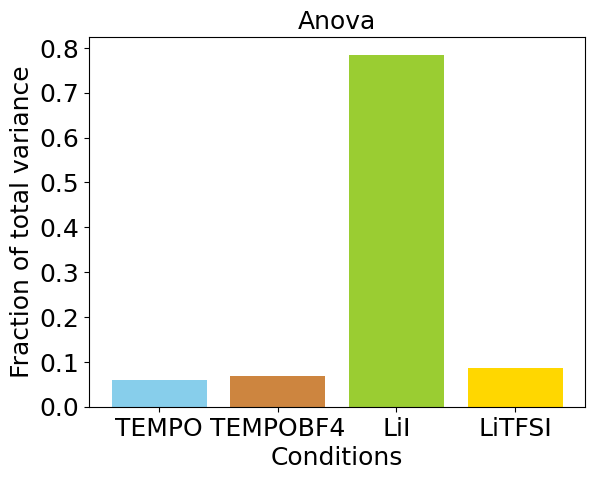

In [38]:
anova(names, 'PCE')

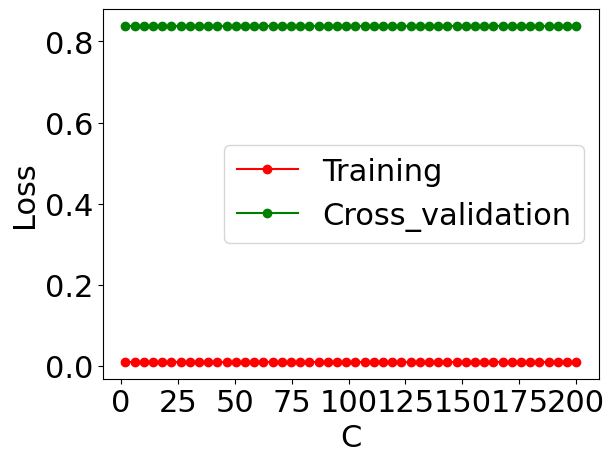

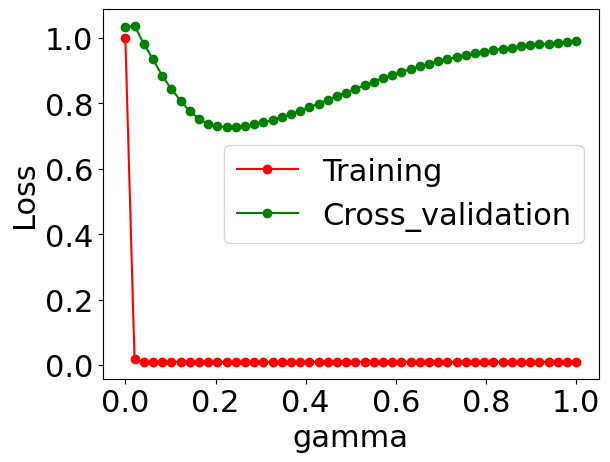

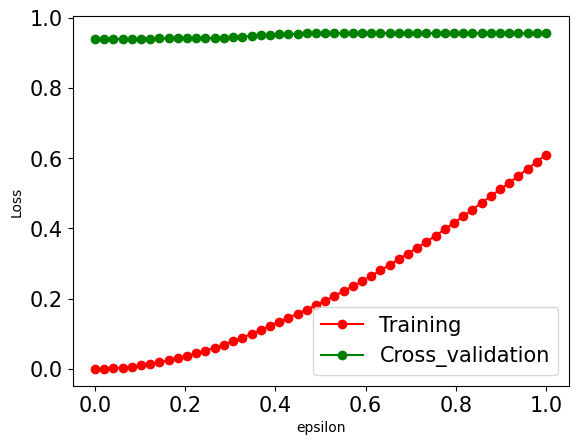

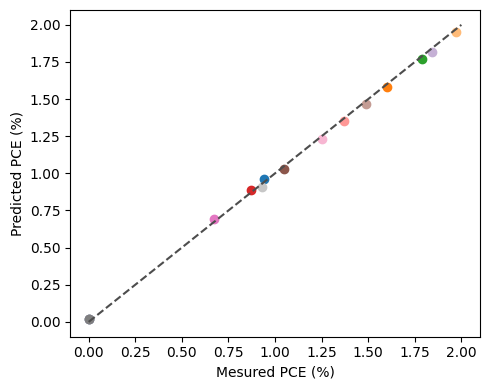

R2 = 0.999698470031117
C= 100
gamma= 0.7270415761049364
epsilon= 0.02040816326530612


In [39]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
reg_pce=pred_fit('PCE', [0,2])

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not ha

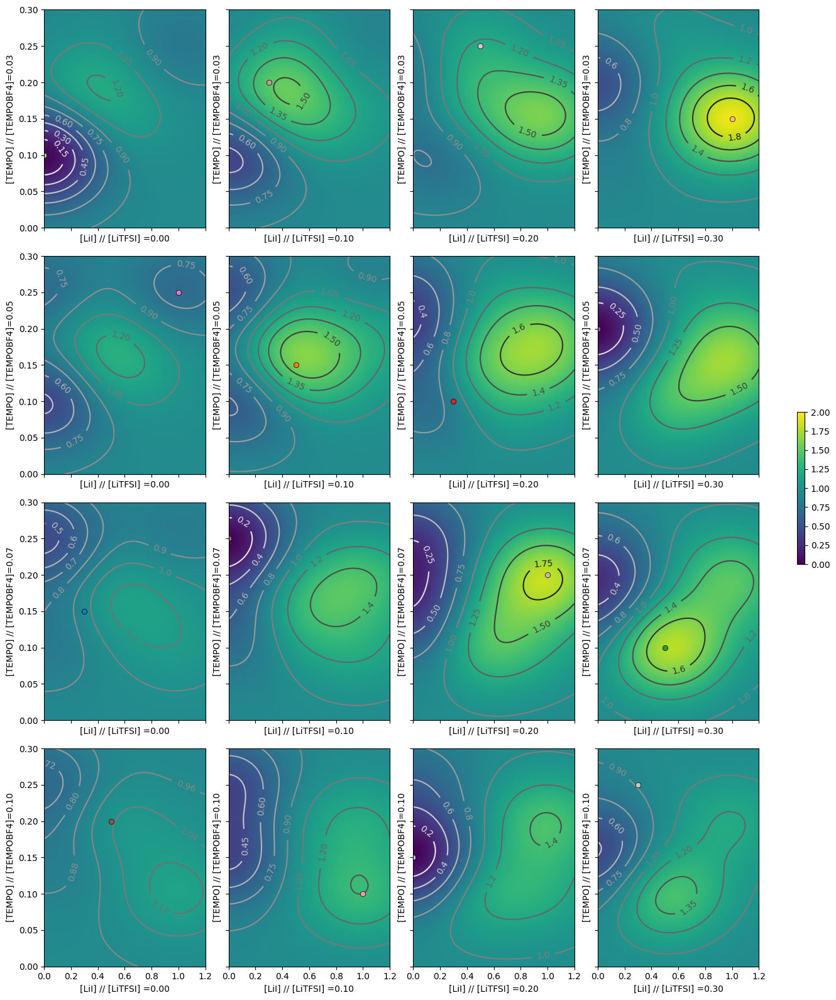

In [40]:
data_u=[0.025, 0.05, 0.075, 0.1]
data_v=[0, 0.1, 0.2, 0.3]
surface_plot(reg_pce, 0, 1.2, 0, 0.3, 0, 2, 'viridis')

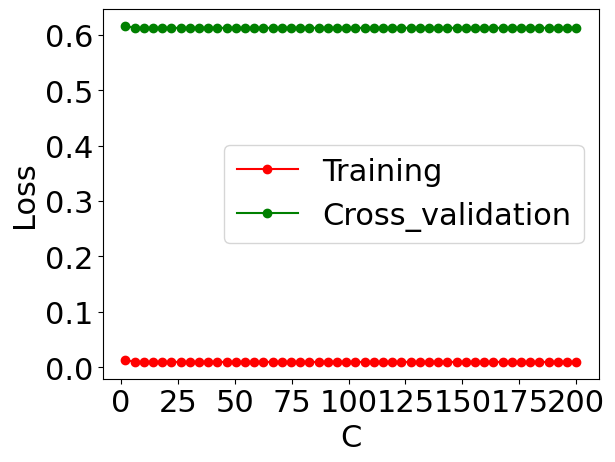

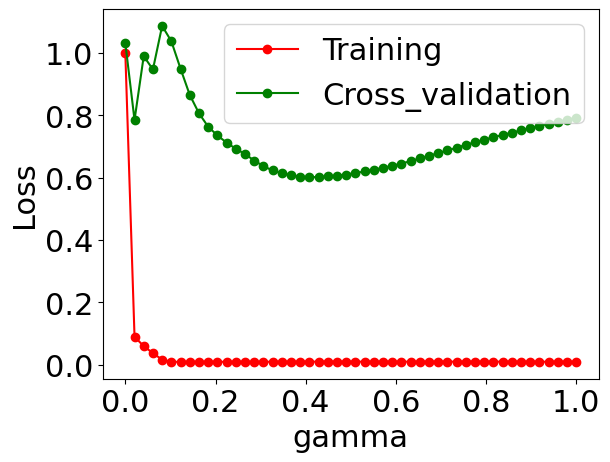

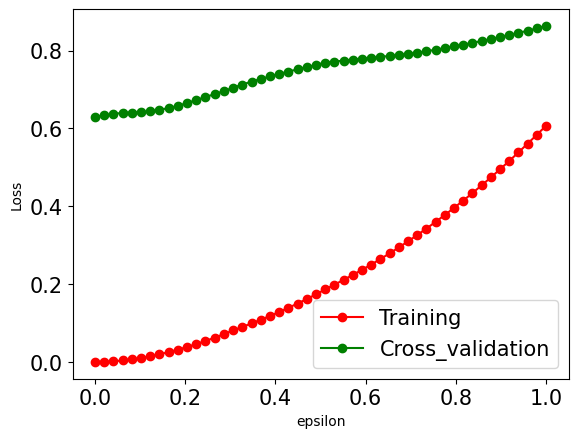

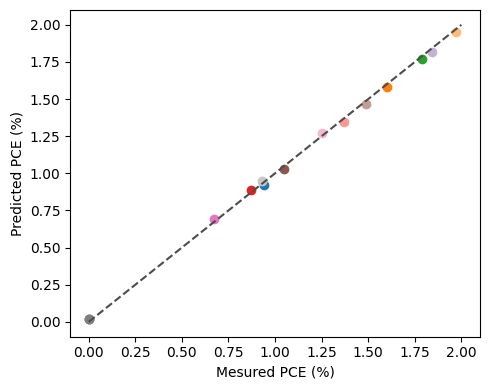

R2 = 0.9996101418533071
C= 100
gamma= 0.6013908941119318
epsilon= 0.02040816326530612


In [35]:
names = ['TEMPOBF4', 'LiI', 'LiTFSI']
reg_pce2=pred_fit('PCE', [0,2])

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


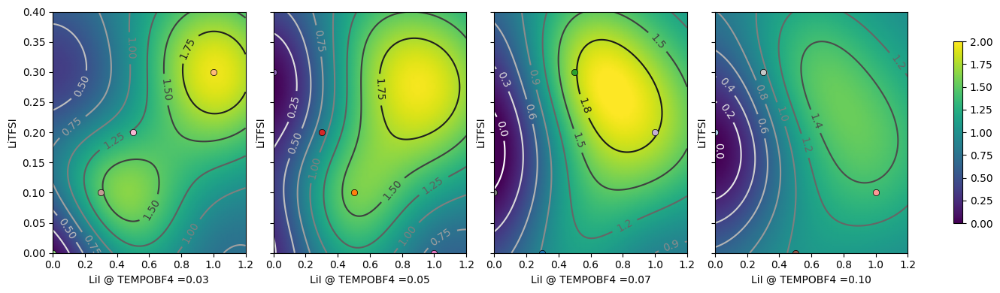

In [38]:
data_v=[0.025, 0.05, 0.075, 0.1]
surface_plot(reg_pce2, 0, 1.2, 0, 0.4, 0, 2, 'viridis')

AVT ~ + C(LiI) + C(TEMPO) + C(TEMPOBF4) + C(LiTFSI)
              df     sum_sq     mean_sq         F    PR(>F)
C(LiI)       3.0  295.68135   98.560450  1.618257  0.351082
C(TEMPO)     3.0  102.26015   34.086717  0.559667  0.677316
C(TEMPOBF4)  3.0  333.87820  111.292733  1.827307  0.316410
C(LiTFSI)    3.0  543.39035  181.130117  2.973962  0.197309
Residual     3.0  182.71595   60.905317       NaN       NaN
[0.2318687419378482, 0.08019082816983754, 0.2618221209909687, 0.4261183089013455]


C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=16
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  totalSSRnoRes = sum(res.sum_sq)-res.sum_sq[-1]  # for normalizing
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  performance+=[res.sum_sq[i]/totalSSRnoRes]


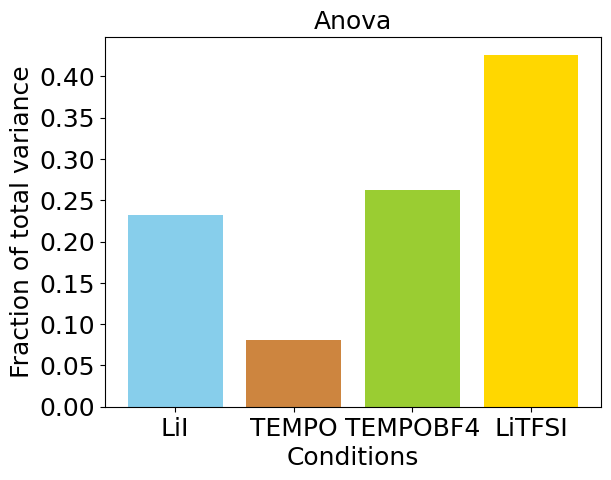

In [41]:
anova(names, 'AVT')

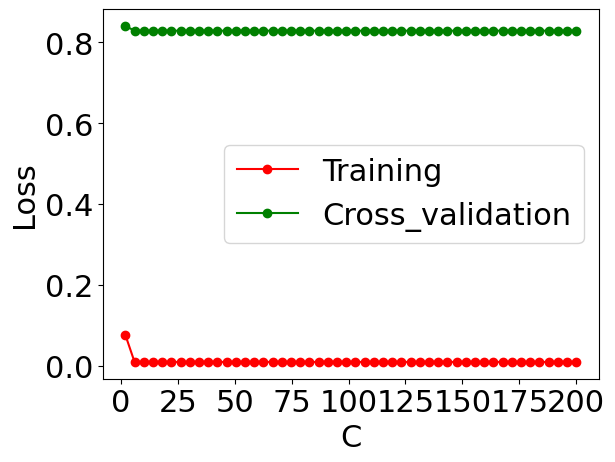

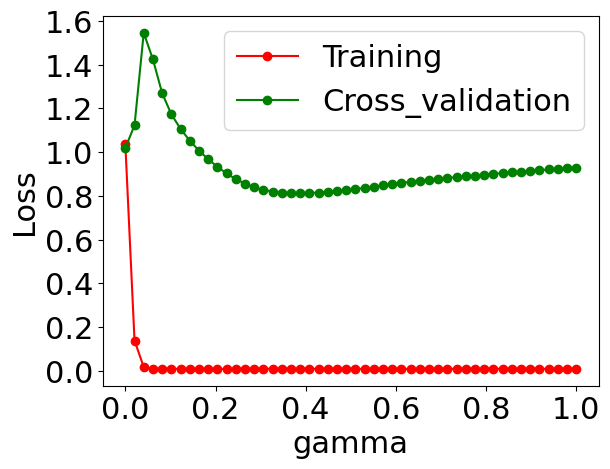

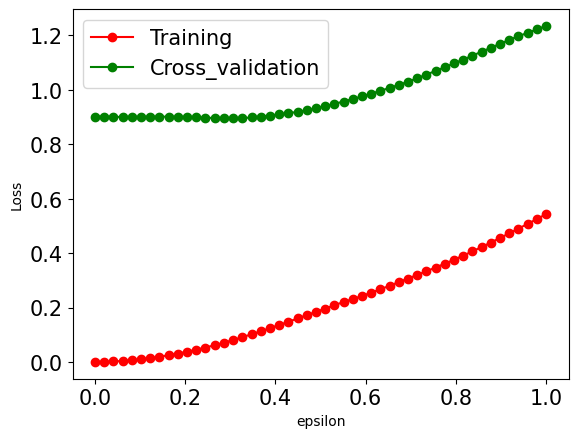

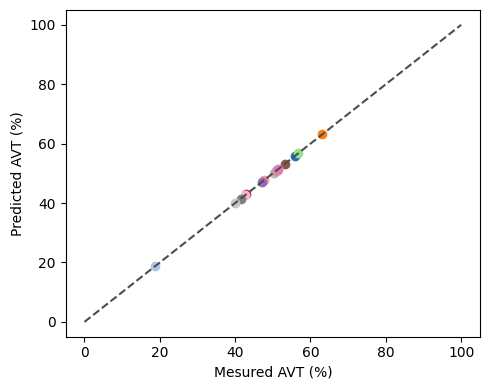

R2 = 0.9999982878889422
C= 100
gamma= 0.813039284937835
epsilon= 0.02040816326530612


In [42]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
reg_avt=pred_fit('AVT', [0,100])

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not ha

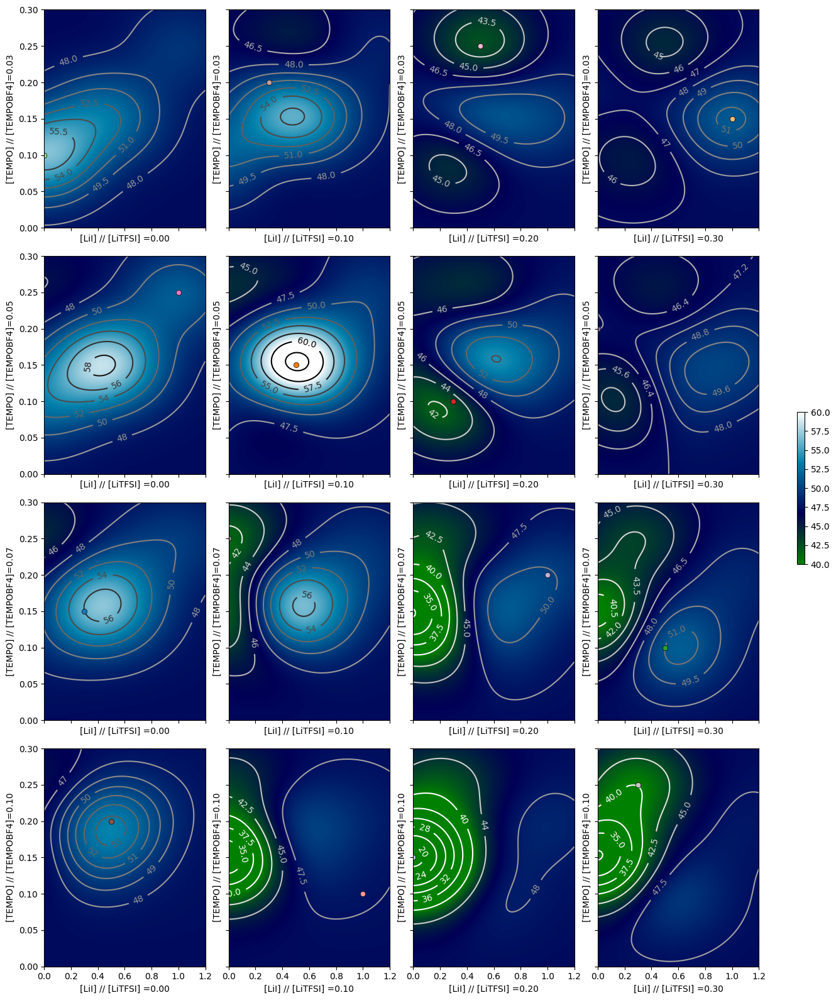

In [43]:
data_u=[0.025, 0.05, 0.075, 0.1]
data_v=[0, 0.1, 0.2, 0.3]
surface_plot(reg_avt, 0, 1.2, 0, 0.3, 40, 60, 'ocean')

LUEp ~ + C(LiI) + C(TEMPO) + C(TEMPOBF4) + C(LiTFSI)
              df     sum_sq    mean_sq          F    PR(>F)
C(LiI)       3.0  51.971129  17.323710  39.244524  0.006600
C(TEMPO)     3.0  24.565878   8.188626  18.550226  0.019335
C(TEMPOBF4)  3.0   6.195684   2.065228   4.678495  0.118606
C(LiTFSI)    3.0   7.270167   2.423389   5.489860  0.097797
Residual     3.0   1.324290   0.441430        NaN       NaN
[0.5774386533724176, 0.272945528641367, 0.06883874868491772, 0.08077706930129767]


C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\scipy\stats\_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=16
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  totalSSRnoRes = sum(res.sum_sq)-res.sum_sq[-1]  # for normalizing
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  performance+=[res.sum_sq[i]/totalSSRnoRes]


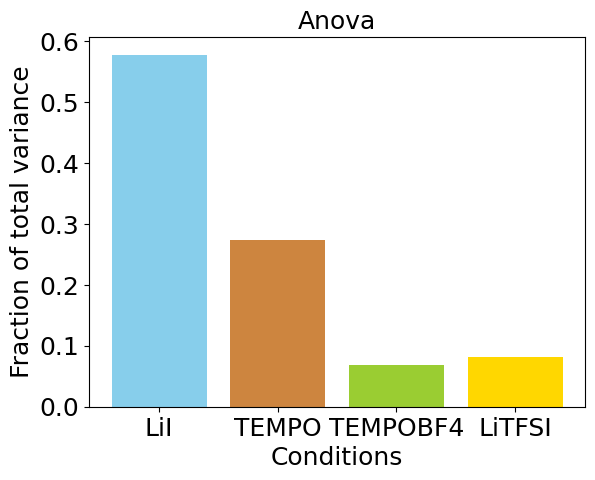

In [44]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
anova(names, 'LUEp')

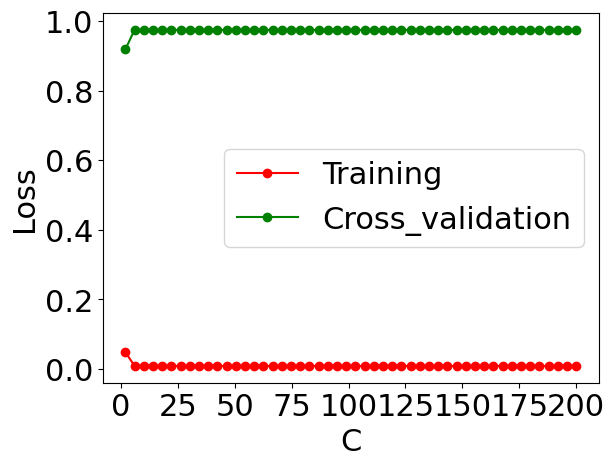

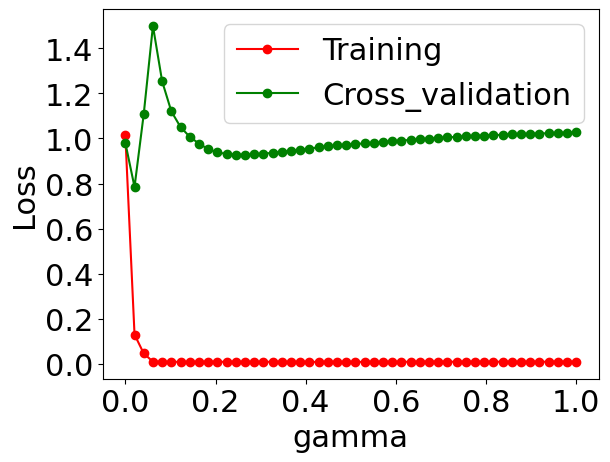

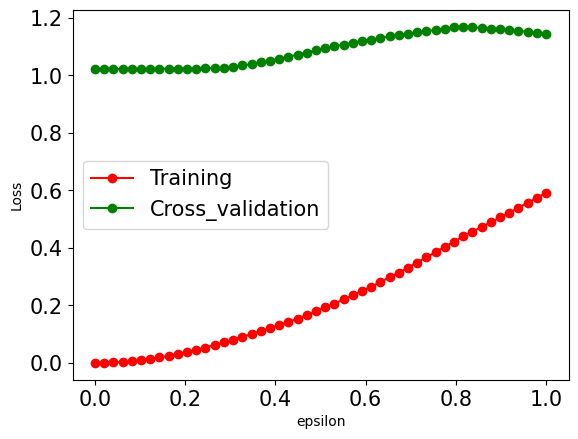

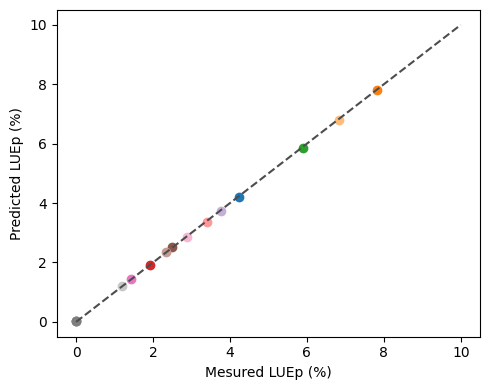

R2 = 0.9999759378193438
C= 100
gamma= 0.9277046570539064
epsilon= 0.02040816326530612


In [45]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
reg_avt=pred_fit('LUEp', [0,10])

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not ha

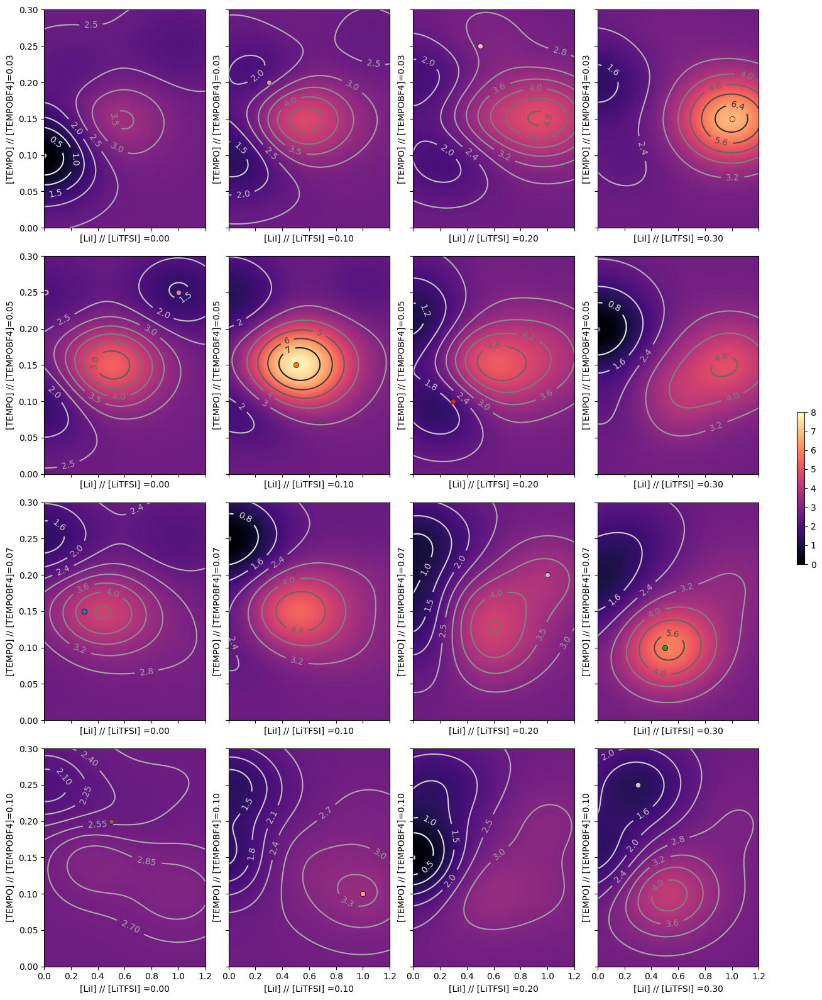

In [46]:
data_u=[0.025, 0.05, 0.075, 0.1]
data_v=[0, 0.1, 0.2, 0.3]
surface_plot(reg_avt, 0, 1.2, 0, 0.3, 0, 8, 'magma')

In [47]:
df = pd.read_csv("TEMPO-2.csv", sep=";") #tableau bien en .CSV dans le même dossier que le programme !
##suppression des NaN: si une fois affiché df comporte des cases NaN, la première ligme ci dessous permet de
#supprimer les lignes ayant moins de 'x' valeurs non NaN (à changer en fonction du tableau obtenu) 
#et la 2 supprime les colonnes comportant au moins un NaN.
#df = df.dropna(thresh=7)
#df= df.dropna(axis='columns')#suppression des NaN
colors = plt.cm.tab20(np.linspace(0, 1, 23)[0:len(df.exp.unique())])
color_dic = {label: color for label, color in zip(df.exp.unique(), colors)}
df['color'] = df.exp.map(color_dic) #ajoute une colonne 'color' à df pour donner une couleur unique à chaque expériences

names = ['TEMPO', 'TEMPOBF4', 'LiI', 'LiTFSI'] #utiliser ici le nom des colonnes exact de df

df

,exp,TEMPO,TEMPOBF4,LiI,LiTFSI,PCE,AVT,LUEp,color
0,1-1,0.150,0.075,0.3,0.0,0.940,56.00000,4.238325,"[0.12156862745098039, 0.4666666666666667, 0.70..."
1,1-2,0.150,0.100,0.0,0.2,0.000,18.75000,0.000000,"[0.12156862745098039, 0.4666666666666667, 0.70..."
2,1-3,0.150,0.050,0.5,0.1,1.600,63.12000,7.834911,"[0.6823529411764706, 0.7803921568627451, 0.909..."
3,1-4,0.150,0.025,1.0,0.3,1.970,51.30000,6.823835,"[1.0, 0.4980392156862745, 0.054901960784313725..."
4,1-5,0.100,0.075,0.5,0.3,1.790,51.00000,5.889677,"[1.0, 0.7333333333333333, 0.47058823529411764,..."
5,1-6,0.100,0.025,0.0,0.0,0.000,56.73000,0.000000,"[0.17254901960784313, 0.6274509803921569, 0.17..."
6,1-7,0.100,0.050,0.3,0.2,0.870,43.00000,1.908673,"[0.596078431372549, 0.8745098039215686, 0.5411..."
7,1-8,0.100,0.100,1.0,0.1,1.370,47.72000,3.397942,"[0.8392156862745098, 0.15294117647058825, 0.15..."
8,1-9,0.200,0.050,0.0,0.3,0.000,47.24000,0.000000,"[1.0, 0.596078431372549, 0.5882352941176471, 1.0]"
9,1-10,0.200,0.075,1.0,0.2,1.840,50.22000,3.767012,"[0.5803921568627451, 0.403921568627451, 0.7411..."


PCE ~ + C(TEMPO) + C(TEMPOBF4) + C(LiI) + C(LiTFSI)
              df    sum_sq   mean_sq          F    PR(>F)
C(TEMPO)     5.0  0.664562  0.132912   2.825606  0.139435
C(TEMPOBF4)  3.0  0.735854  0.245285   5.214547  0.053461
C(LiI)       7.0  6.250762  0.892966  18.983701  0.002548
C(LiTFSI)    3.0  0.443557  0.147852   3.143214  0.124756
Residual     5.0  0.235193  0.047039        NaN       NaN
[0.0820980774370259, 0.09090530011220055, 0.7722009038286639, 0.054795718622109656]


C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  totalSSRnoRes = sum(res.sum_sq)-res.sum_sq[-1]  # for normalizing
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  performance+=[res.sum_sq[i]/totalSSRnoRes]


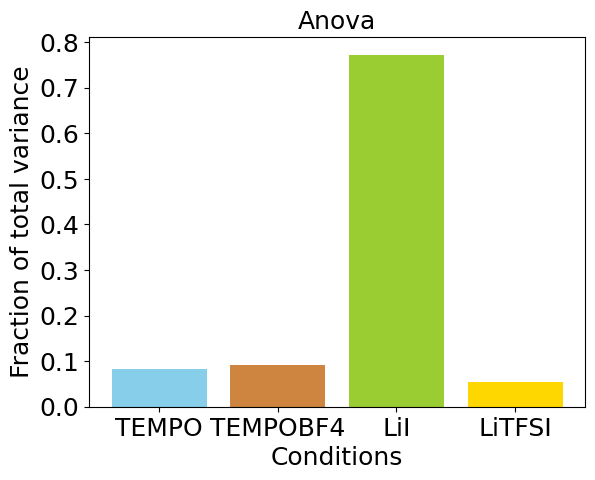

In [48]:
anova(names, 'PCE')

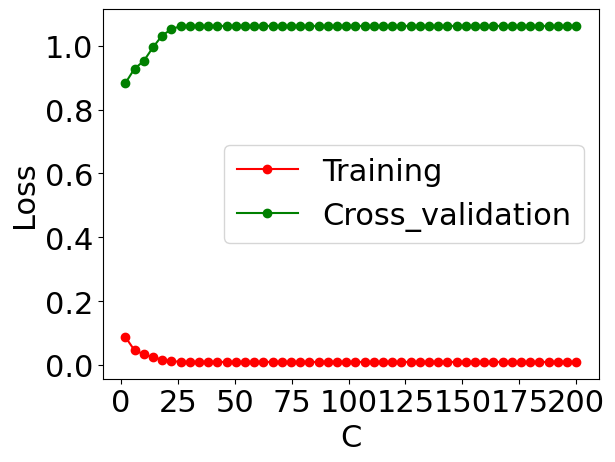

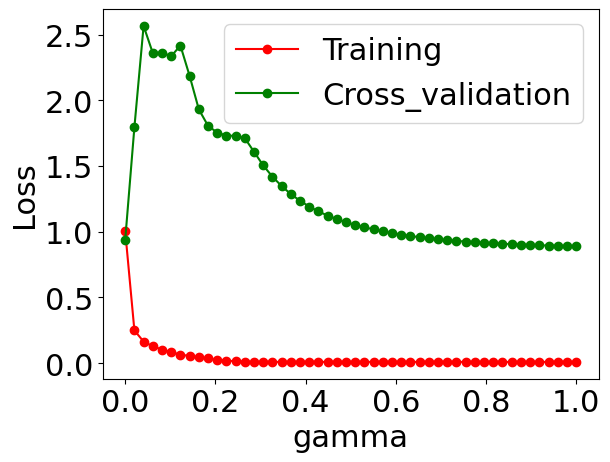

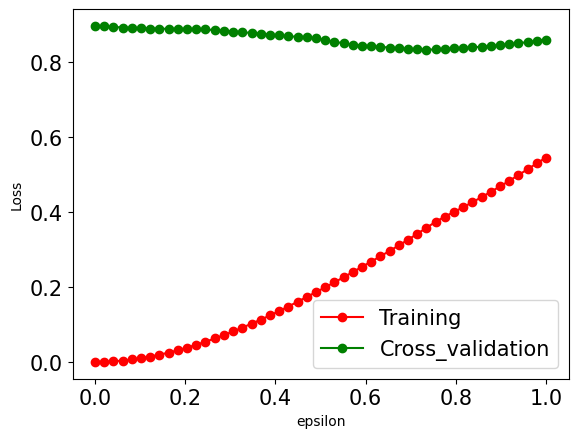

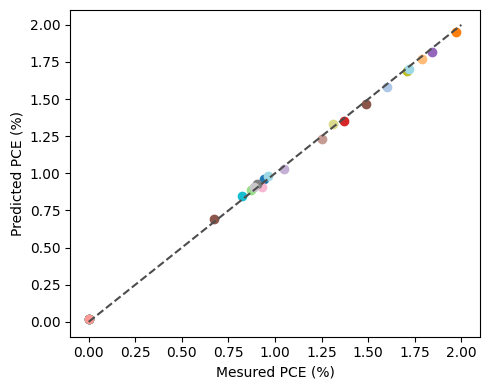

R2 = 0.9994724084162785
C= 100
gamma= 1.0
epsilon= 0.02040816326530612


In [49]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
reg_pce=pred_fit('PCE', [0,2])

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not ha

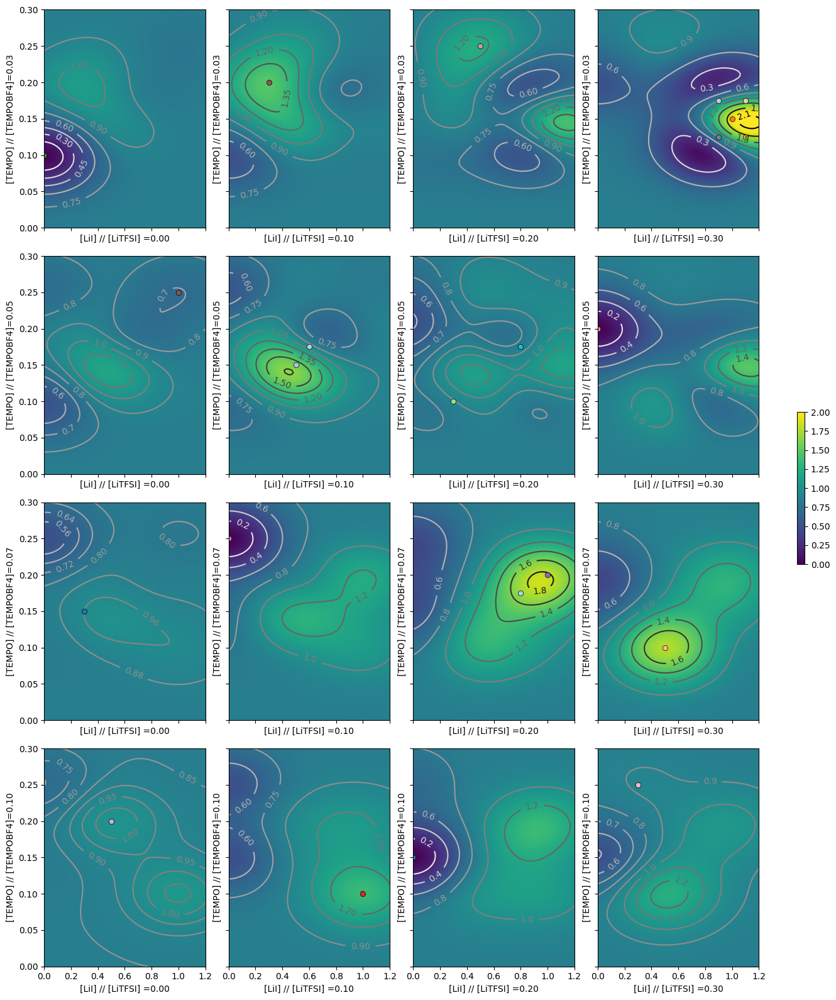

In [50]:
data_u=[0.025, 0.05, 0.075, 0.1]
data_v=[0, 0.1, 0.2, 0.3]
surface_plot(reg_pce, 0, 1.2, 0, 0.3, 0, 2, 'viridis')

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


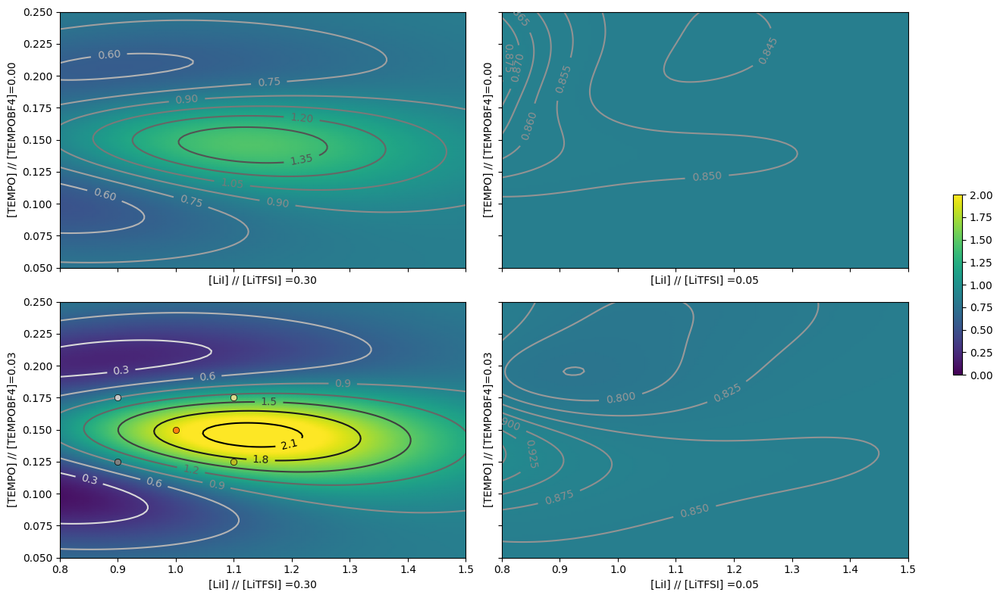

In [52]:
data_u=[0, 0.025]
data_v=[0.3, 0.05]
surface_plot(reg_pce, 0.8, 1.5, 0.05, 0.25, 0, 2, 'viridis')

AVT ~ + C(LiI) + C(TEMPO) + C(TEMPOBF4) + C(LiTFSI)
              df      sum_sq     mean_sq         F    PR(>F)
C(LiI)       7.0  673.465033   96.209290  2.615384  0.153638
C(TEMPO)     5.0  172.250552   34.450110  0.936503  0.527818
C(TEMPOBF4)  3.0  263.749727   87.916576  2.389953  0.184928
C(LiTFSI)    3.0  600.744115  200.248038  5.443607  0.049426
Residual     5.0  183.929539   36.785908       NaN       NaN
[0.3937909721766056, 0.10071898159744778, 0.15422071897935316, 0.3512693272465935]


C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  totalSSRnoRes = sum(res.sum_sq)-res.sum_sq[-1]  # for normalizing
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  performance+=[res.sum_sq[i]/totalSSRnoRes]


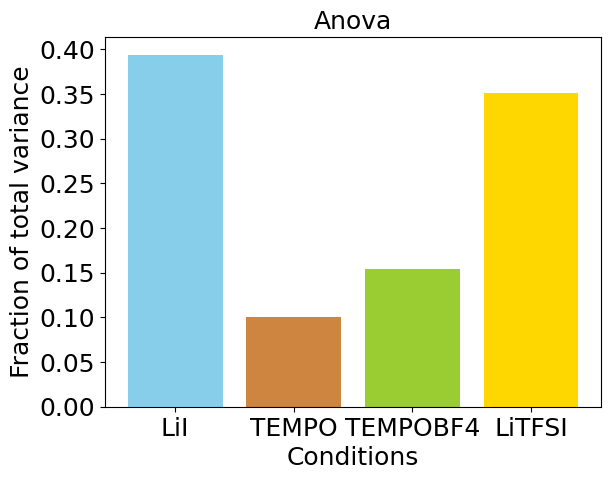

In [55]:
anova(names, 'AVT')

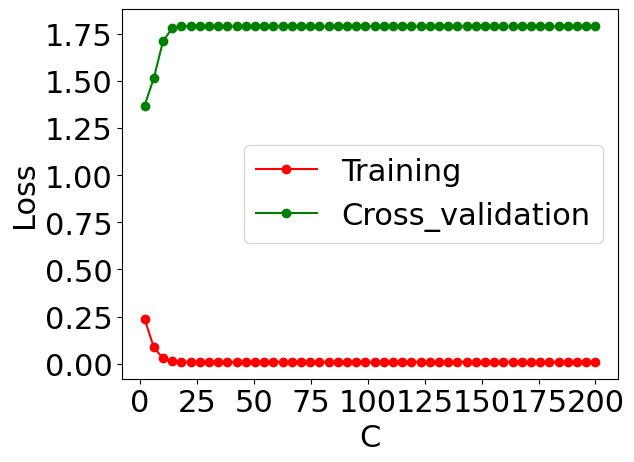

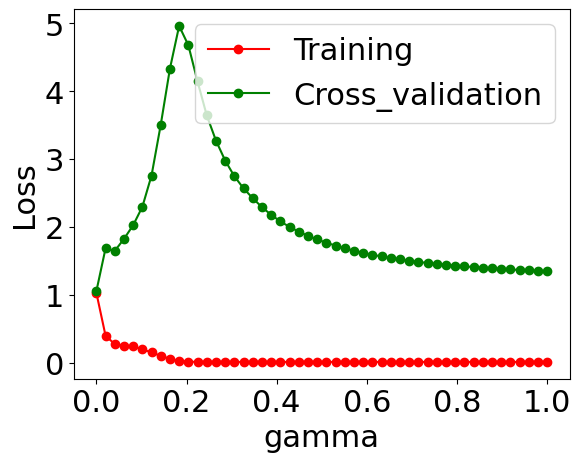

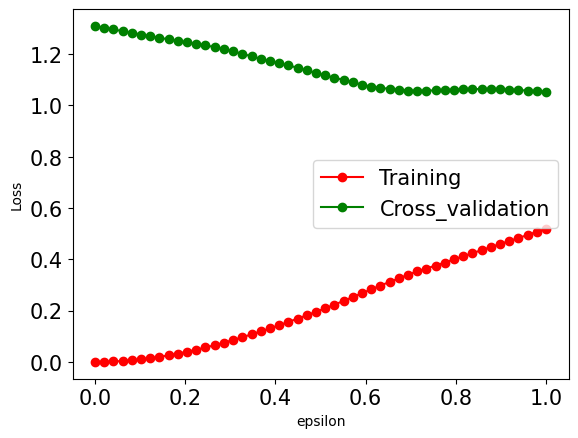

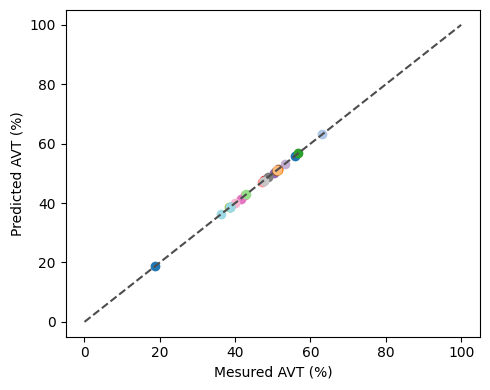

R2 = 0.999997901077854
C= 100
gamma= 1.3449073895765227
epsilon= 0.02040816326530612


In [56]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
reg_avt=pred_fit('AVT', [0,100])

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not ha

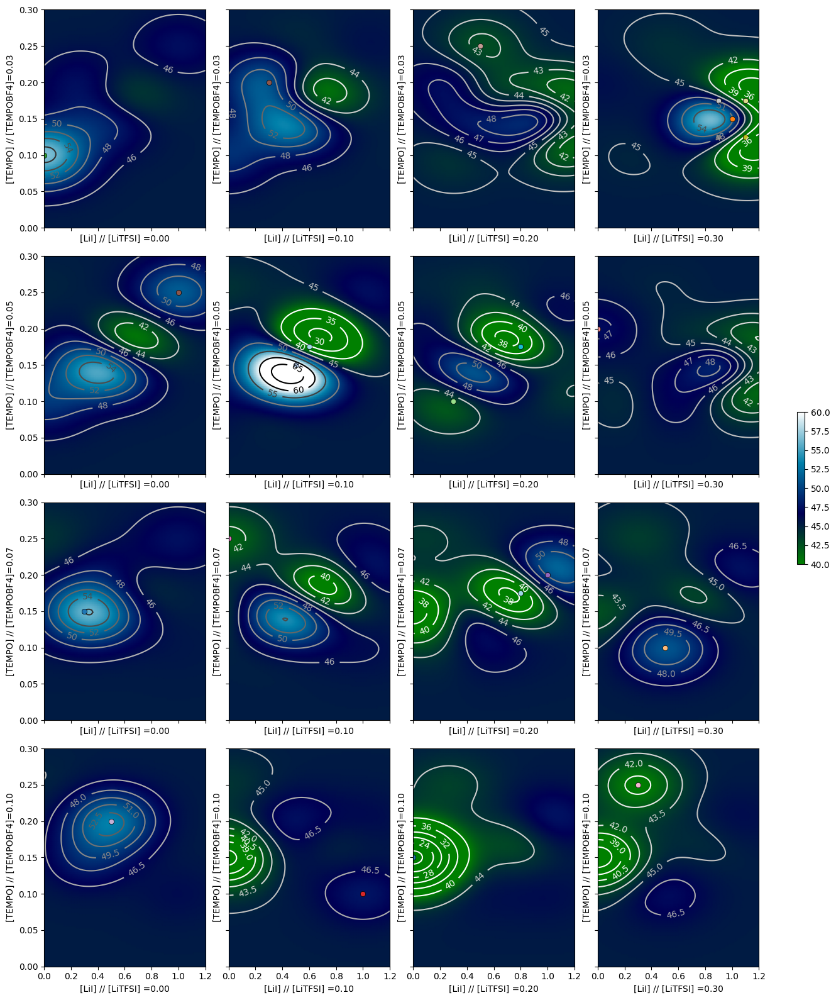

In [57]:
data_u=[0.025, 0.05, 0.075, 0.1]
data_v=[0, 0.1, 0.2, 0.3]
surface_plot(reg_avt, 0, 1.2, 0, 0.3, 40, 60, 'ocean')

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


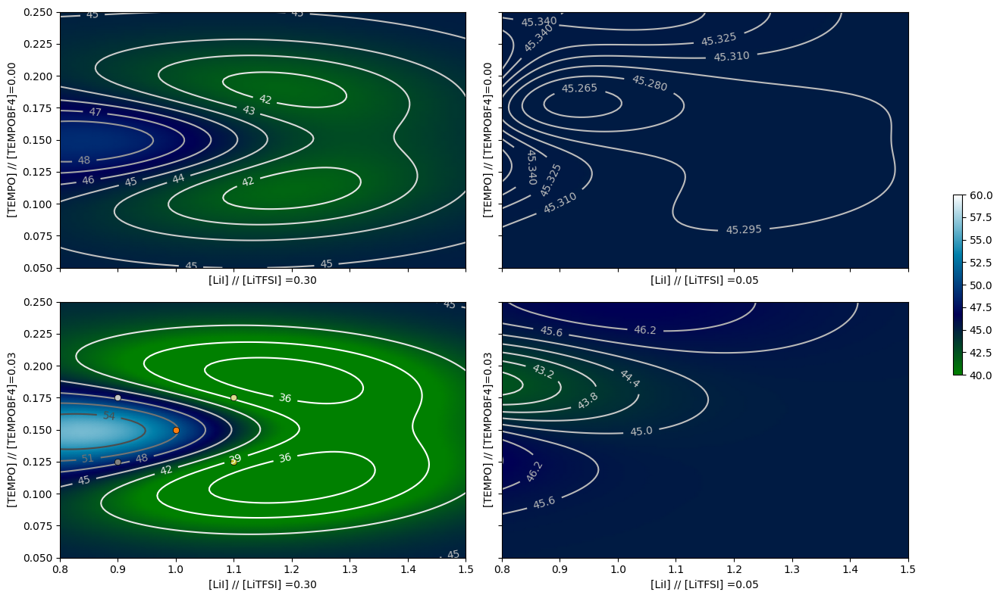

In [34]:
data_u=[0, 0.025]
data_v=[0.3, 0.05]
surface_plot(reg_avt, 0.8, 1.5, 0.05, 0.25, 40, 60, 'ocean')

LUEp ~ + C(LiI) + C(TEMPO) + C(TEMPOBF4) + C(LiTFSI)
              df     sum_sq    mean_sq         F    PR(>F)
C(LiI)       7.0  86.855191  12.407884  4.588891  0.056281
C(TEMPO)     5.0  28.681421   5.736284  2.121488  0.214329
C(TEMPOBF4)  3.0   9.951264   3.317088  1.226781  0.391518
C(LiTFSI)    3.0  11.059256   3.686419  1.363373  0.354591
Residual     5.0  13.519482   2.703896       NaN       NaN
[0.6360821338390649, 0.21004777097225805, 0.07287786674778558, 0.08099222844089148]


C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:17: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  totalSSRnoRes = sum(res.sum_sq)-res.sum_sq[-1]  # for normalizing
C:\Users\Johan Liotier\AppData\Local\Temp\ipykernel_12056\347748843.py:21: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  performance+=[res.sum_sq[i]/totalSSRnoRes]


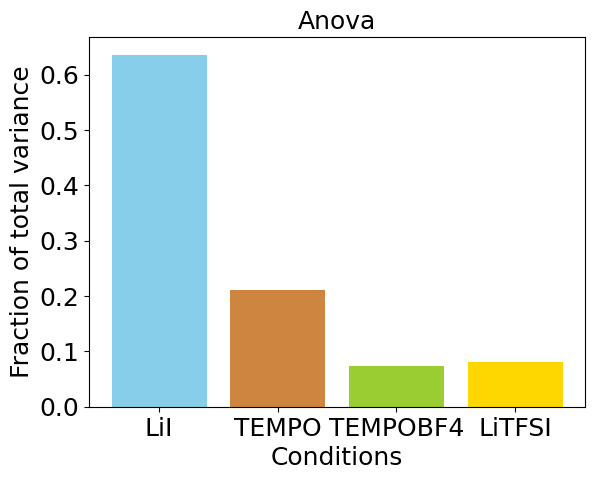

In [16]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
anova(names, 'LUEp')

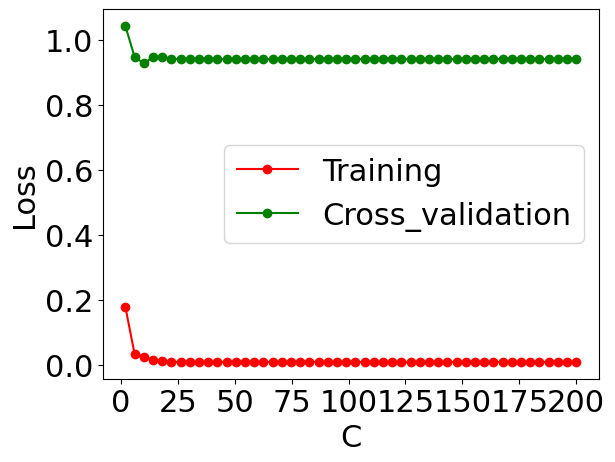

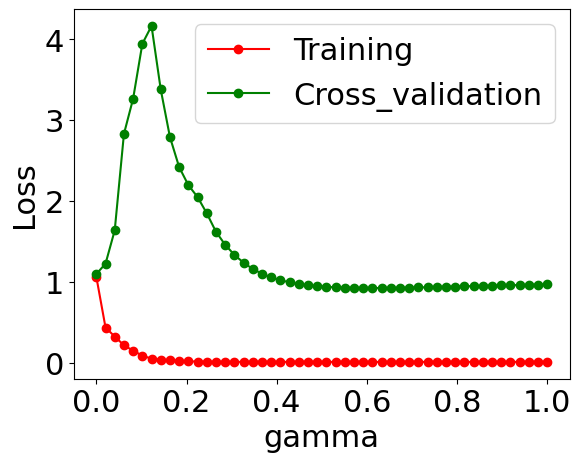

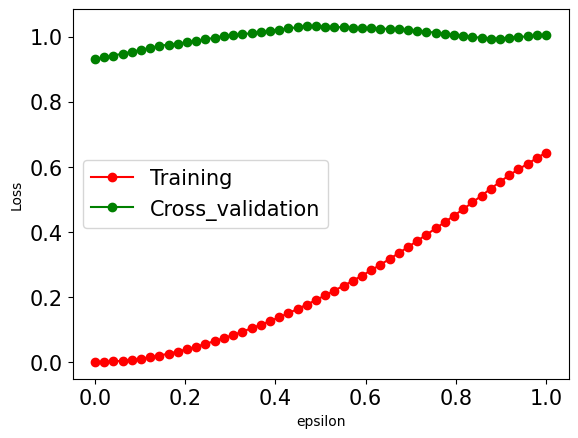

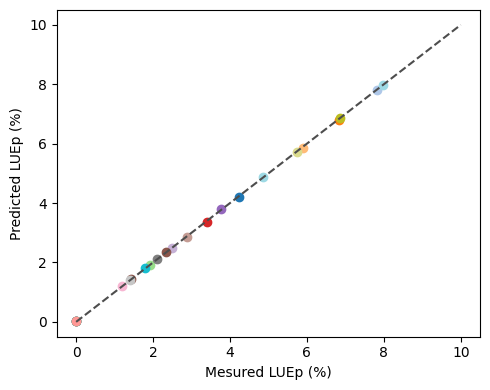

R2 = 0.9999715347441374
C= 100
gamma= 0.9230791075010305
epsilon= 0.02040816326530612


In [58]:
names = ['LiI', 'TEMPO', 'TEMPOBF4', 'LiTFSI']
reg_lue=pred_fit('LUEp', [0,10])

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not ha

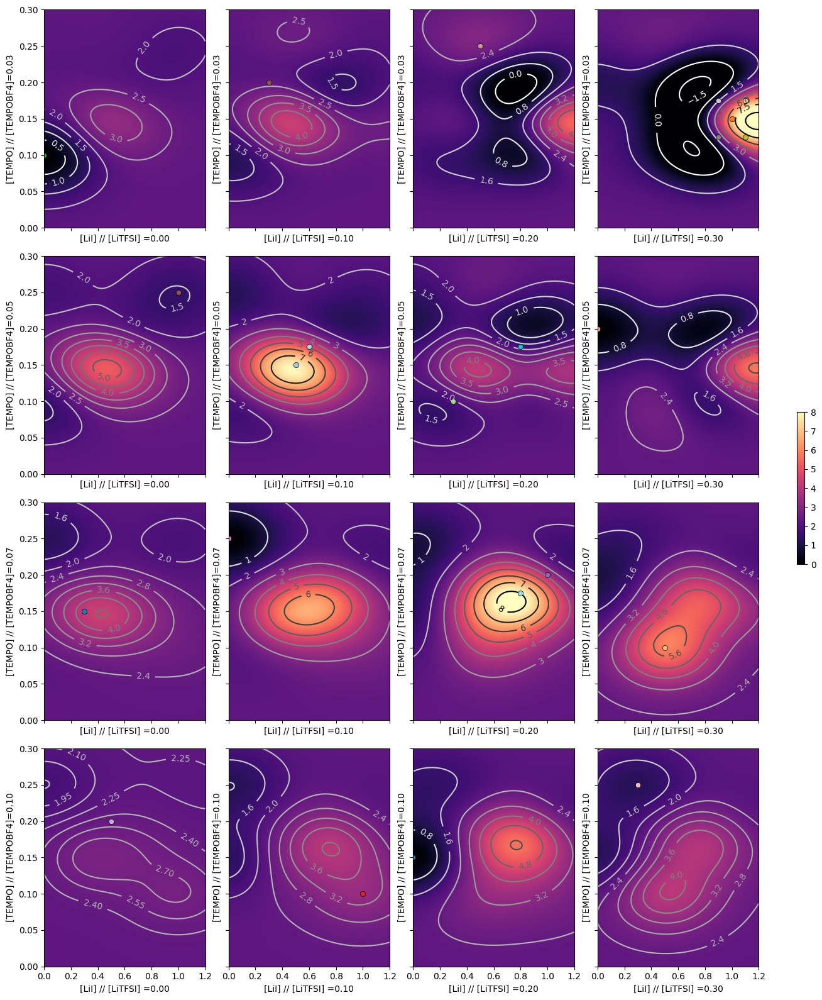

In [59]:
data_u=[0.025, 0.05, 0.075, 0.1]
data_v=[0, 0.1, 0.2, 0.3]
surface_plot(reg_lue, 0, 1.2, 0, 0.3, 0, 8, 'magma')

C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(
C:\Users\Johan Liotier\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


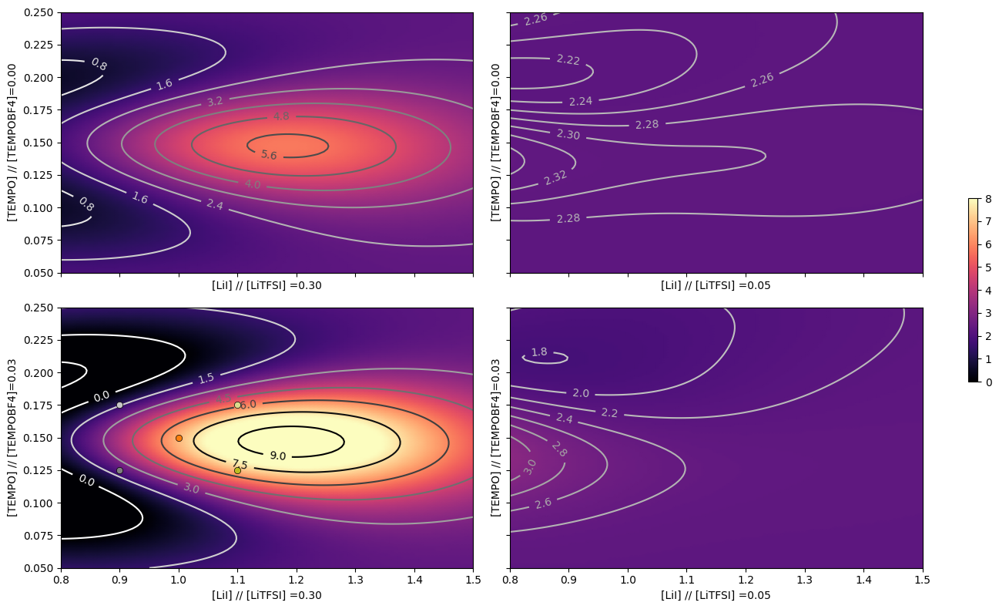

In [33]:
data_u=[0, 0.025]
data_v=[0.3, 0.05]
surface_plot(reg_lue, 0.8, 1.5, 0.05, 0.25, 0, 8, 'magma')